<a href="https://colab.research.google.com/github/saichaitanyakumar/INSE-_6220_-PROJECT/blob/main/Multi-class%20Classification%20with%20PyCaret.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-class Classification with PyCaret

Multiclass classification is a supervised machine learning technique where the goal is to classify instances into one of three or more classes. (Classifying instances into one of two classes is called Binary Classification).

### Install Pycaret

In [ ]:
# Install slim version (default): if you get an error message, run it again
!pip install pycaret==2.3.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

## Import Libraries

In [ ]:
import numpy as np

# Open source data analysis and manipulation library for Python
import pandas as pd

# matplotlib - The Python library is needed to plot nice charts
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (7,5)

# 'seaborn' - a matplotlib based statistical graphical library
import seaborn as sns; 
sns.set() # Use seaborn plotting style defaults
sns.set_theme(style="darkgrid")


from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


## Dataset

The examined group comprised kernels belonging to three different varieties of wheat: Kama, Rosa and Canadian, 70 elements each, randomly selected for
the experiment. High quality visualization of the internal kernel structure was detected using a soft X-ray technique. It is non-destructive and considerably cheaper than other more sophisticated imaging techniques like scanning microscopy or laser technology. The images were recorded on 13x18 cm X-ray KODAK plates. Studies were conducted using combine harvested wheat grain originating from experimental fields, explored at the Institute of Agrophysics of the Polish Academy of Sciences in Lublin.

The data set can be used for the tasks of classification and cluster analysis.


Attribute Information:

To construct the data, seven geometric parameters of wheat kernels were measured:
1. area A,
2. perimeter P,
3. compactness C = 4*pi*A/P^2,
4. length of kernel,
5. width of kernel,
6. asymmetry coefficient
7. length of kernel groove.
All of these parameters were real-valued continuous.

https://archive.ics.uci.edu/ml/datasets/seeds

In [ ]:
# Read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/saichaitanyakumar/INSE-_6220_-PROJECT/main/diary_queen.csv')
df.head(25)

,Calories (kcal),Fat Calories (kcal),Total Fat (g),Saturated Fat (g),Trans Fat (g),Cholesterol (mg),Sodium (mg),Carbohydrates (g),Sugars (g),Protein (g),Fiber (g),class
0,600,100,27.0,21.0,1.0,45,240,79,65,12.0,1,1
1,830,170,39.0,31.0,1.0,55,310,106,86,16.0,1,1
2,1100,230,52.0,41.0,1.5,75,410,140,113,20.0,2,1
3,360,300,13.0,8.0,0.5,45,150,53,43,8.0,0,0
4,620,240,22.0,14.0,1.0,85,270,93,75,13.0,0,0
5,890,350,32.0,20.0,1.5,120,390,132,106,18.0,1,1
6,1170,470,43.0,27.0,2.0,160,520,175,139,22.0,1,1
7,390,110,16.0,8.0,0.0,35,160,54,42,8.0,0,0
8,700,200,30.0,14.0,1.0,55,290,95,74,13.0,0,0
9,960,290,42.0,19.0,1.0,75,400,129,100,17.0,1,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Calories (kcal)      225 non-null    int64  
 1   Fat Calories (kcal)  225 non-null    int64  
 2   Total Fat (g)        225 non-null    float64
 3   Saturated Fat (g)    225 non-null    float64
 4   Trans Fat (g)        225 non-null    float64
 5   Cholesterol (mg)     225 non-null    int64  
 6   Sodium (mg)          225 non-null    int64  
 7   Carbohydrates (g)    225 non-null    int64  
 8   Sugars (g)           225 non-null    int64  
 9   Protein (g)          225 non-null    float64
 10  Fiber (g)            225 non-null    int64  
 11  class                225 non-null    int64  
dtypes: float64(4), int64(8)
memory usage: 21.2 KB


In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [ ]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


## Exploratory Data Analysis

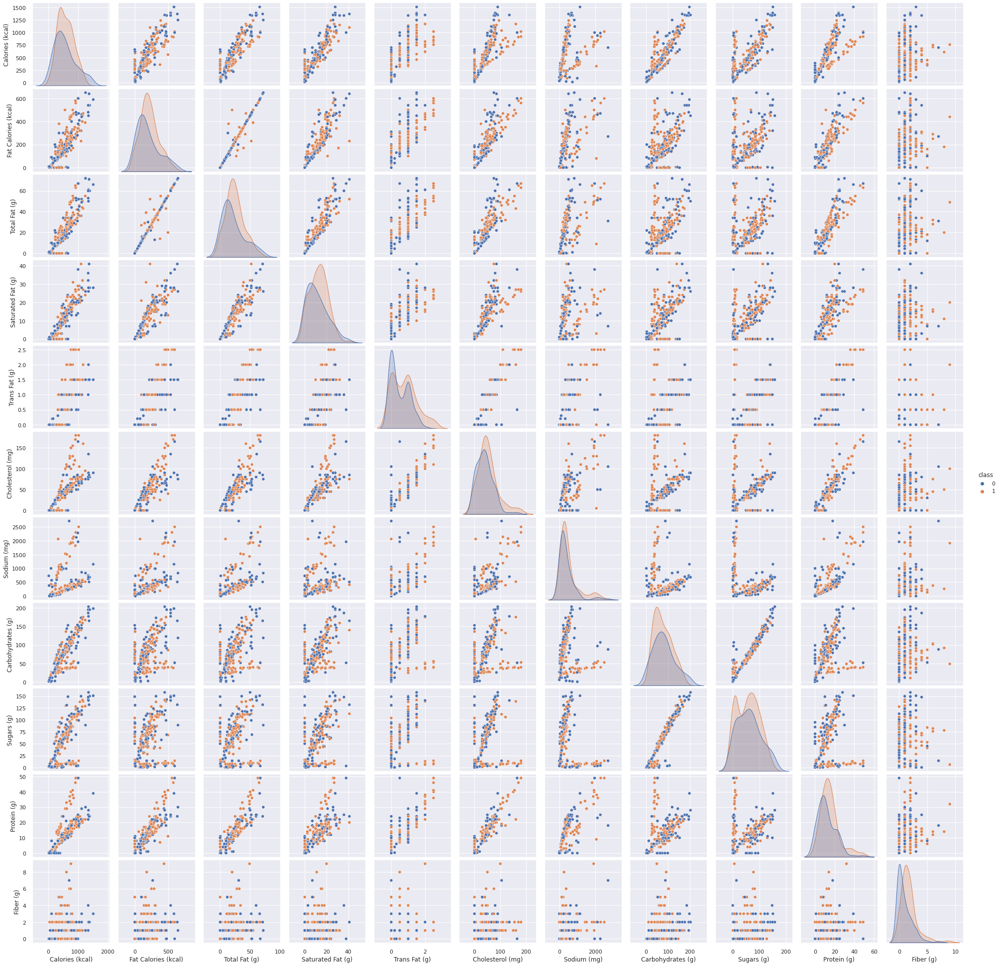

In [ ]:
sns.pairplot(df, hue='class')
plt.show()

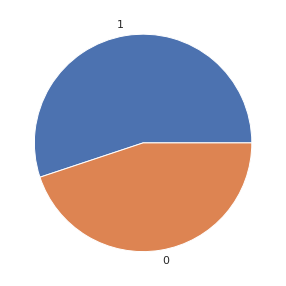

In [ ]:
y = df['class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

### Data Matrix

In [ ]:
X = df.drop(columns=['class'])
X.head(10)

,Calories (kcal),Fat Calories (kcal),Total Fat (g),Saturated Fat (g),Trans Fat (g),Cholesterol (mg),Sodium (mg),Carbohydrates (g),Sugars (g),Protein (g),Fiber (g)
0,600,100,27.0,21.0,1.0,45,240,79,65,12.0,1
1,830,170,39.0,31.0,1.0,55,310,106,86,16.0,1
2,1100,230,52.0,41.0,1.5,75,410,140,113,20.0,2
3,360,300,13.0,8.0,0.5,45,150,53,43,8.0,0
4,620,240,22.0,14.0,1.0,85,270,93,75,13.0,0
5,890,350,32.0,20.0,1.5,120,390,132,106,18.0,1
6,1170,470,43.0,27.0,2.0,160,520,175,139,22.0,1
7,390,110,16.0,8.0,0.0,35,160,54,42,8.0,0
8,700,200,30.0,14.0,1.0,55,290,95,74,13.0,0
9,960,290,42.0,19.0,1.0,75,400,129,100,17.0,1


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Calories (kcal),225.0,573.377778,312.616642,15.0,340.0,520.0,760.0,1510.0
Fat Calories (kcal),225.0,209.253333,152.340938,0.0,100.0,180.0,290.0,650.0
Total Fat (g),225.0,23.270222,16.933841,0.0,12.0,20.0,32.0,72.0
Saturated Fat (g),225.0,12.315556,8.985627,0.0,6.0,12.0,19.0,41.0
Trans Fat (g),225.0,0.649778,0.659486,0.0,0.0,0.5,1.0,2.5
Cholesterol (mg),225.0,46.466667,36.794919,0.0,25.0,45.0,65.0,180.0
Sodium (mg),225.0,467.977778,517.629189,0.0,170.0,280.0,520.0,2710.0
Carbohydrates (g),225.0,78.537778,44.840189,1.0,40.0,73.0,107.0,203.0
Sugars (g),225.0,59.226667,42.178058,0.0,16.0,59.0,87.0,158.0
Protein (g),225.0,13.599111,9.637811,0.0,8.0,12.0,18.0,49.0


### Standardize the Data

In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns

X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Calories (kcal),Fat Calories (kcal),Total Fat (g),Saturated Fat (g),Trans Fat (g),Cholesterol (mg),Sodium (mg),Carbohydrates (g),Sugars (g),Protein (g),Fiber (g)
0,0.085349,-0.718762,0.220747,0.968637,0.532237,-0.039949,-0.441409,0.010331,0.137185,-0.166291,-0.248970
1,0.822715,-0.258242,0.930967,2.084006,0.532237,0.232433,-0.305875,0.613812,0.636185,0.249667,-0.248970
2,1.688318,0.136489,1.700372,3.199376,1.292094,0.777198,-0.112256,1.373751,1.277755,0.665624,0.434179
3,-0.684076,0.597010,-0.607843,-0.481344,-0.227619,-0.039949,-0.615666,-0.570799,-0.385576,-0.582248,-0.932119
4,0.149468,0.202278,-0.075178,0.187878,0.532237,1.049581,-0.383323,0.323247,0.374804,-0.062301,-0.932119
5,1.015071,0.925953,0.516672,0.857100,1.292094,2.002920,-0.150980,1.194942,1.111422,0.457646,-0.248970
6,1.912734,1.715416,1.167707,1.637858,2.051951,3.092451,0.100725,2.156041,1.895564,0.873603,-0.248970
7,-0.587898,-0.652974,-0.430288,-0.481344,-0.987476,-0.312332,-0.596304,-0.548447,-0.409338,-0.582248,-0.932119
8,0.405943,-0.060876,0.398302,0.187878,0.532237,0.232433,-0.344599,0.367950,0.351042,-0.062301,-0.932119
9,1.239487,0.531221,1.108522,0.745563,0.532237,0.777198,-0.131618,1.127889,0.968851,0.353656,-0.248970


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Calories (kcal),225.0,1.263187e-16,1.00223,-1.790125,-0.748195,-0.171126,0.598299,3.002753
Fat Calories (kcal),225.0,0.000000e+00,1.00223,-1.376648,-0.718762,-0.192454,0.531221,2.899610
Total Fat (g),225.0,-9.473903e-17,1.00223,-1.377249,-0.667028,-0.193548,0.516672,2.884073
Saturated Fat (g),225.0,3.157968e-17,1.00223,-1.373640,-0.704418,-0.035196,0.745563,3.199376
Trans Fat (g),225.0,1.894781e-16,1.00223,-0.987476,-0.987476,-0.227619,0.532237,2.811807
Cholesterol (mg),225.0,-3.157968e-17,1.00223,-1.265671,-0.584715,-0.039949,0.504816,3.637216
Sodium (mg),225.0,3.157968e-17,1.00223,-0.906095,-0.576942,-0.363961,0.100725,4.340986
Carbohydrates (g),225.0,2.368476e-17,1.00223,-1.733058,-0.861364,-0.123776,0.636163,2.781873
Sugars (g),225.0,0.000000e+00,1.00223,-1.407337,-1.027147,-0.005386,0.659946,2.347039
Protein (g),225.0,-1.263187e-16,1.00223,-1.414163,-0.582248,-0.166291,0.457646,3.681315


### Observations and variables

In [ ]:
observations = list(df.index)
variables = list(df.columns)

### Box and Whisker Plots

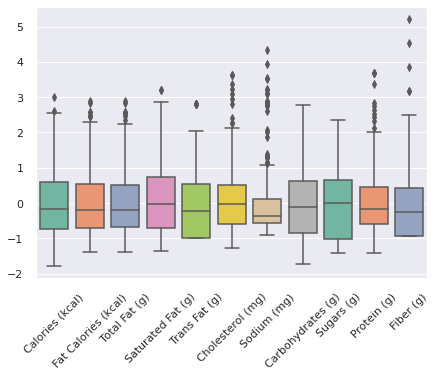

In [ ]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

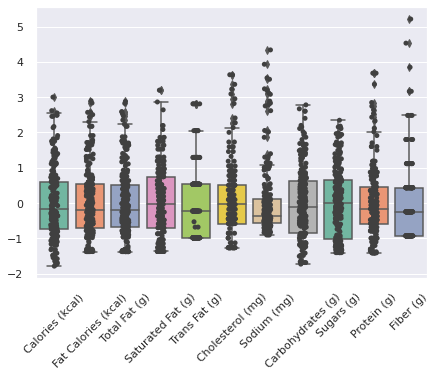

In [ ]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

### Correlation Matrix

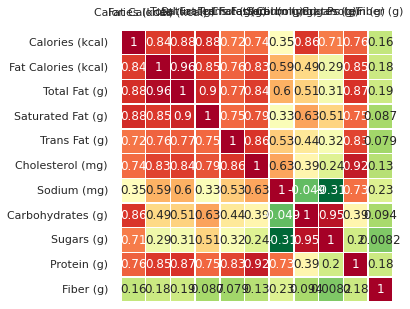

In [ ]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

##**Principal Component Analysis (PCA)**

In [ ]:
# pca = PCA(n_components=2)
# Retain 95% of useful features and create new dimensions
pca = PCA(0.95)
Z = pca.fit_transform(X)

print("Shape of X:", X.shape)
print("Shape of Z:", Z.shape)

Shape of X: (225, 11)
Shape of Z: (225, 5)


In [ ]:
pca.n_components_

5

In [ ]:
print(Z)

[[ 0.21044281 -0.4888457  -0.39884501  0.01985004 -0.76426018]
 [ 1.79173879 -1.03765523 -0.41356485  0.59575466 -0.6319112 ]
 [ 3.88757564 -1.55860459  0.12501433  0.6269288  -0.92579118]
 ...
 [-2.53735642 -0.93184862  2.856852   -0.83925912  0.06597028]
 [-3.07958098 -0.68794343  0.78543106 -0.55591003  0.18700849]
 [-1.5255948  -2.82902709  1.17354022 -1.44285972  1.4564016 ]]


Text(0, 0.5, '$Z_2$')

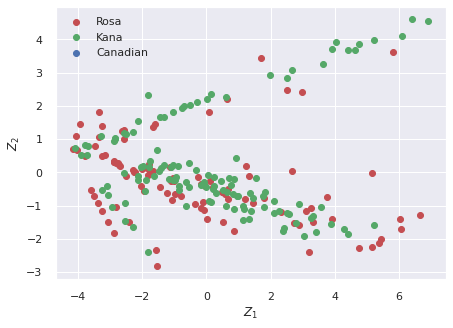

In [ ]:
# 1(Rosa)-> 0,  2(Kama)-> 1, 3(Canadian)->2
idx_Rosa = np.where(y == 0)
idx_Kana = np.where(y == 1)
idx_Canadian = np.where(y == 2)

plt. figure()
plt.scatter(Z[idx_Rosa, 0], Z[idx_Rosa, 1], c='r', label='Rosa')
plt.scatter(Z[idx_Kana, 0], Z[idx_Kana, 1], c='g', label='Kana')
plt.scatter(Z[idx_Canadian, 0], Z[idx_Canadian, 1], c='b', label='Canadian')

plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

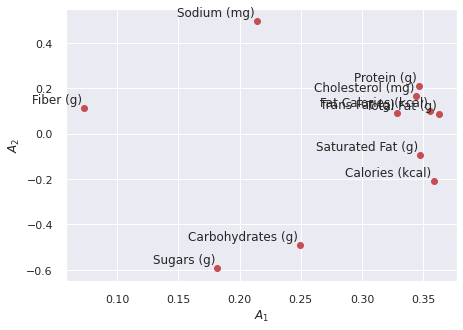

In [ ]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

In [ ]:
A

array([[ 0.35836963, -0.20841284,  0.0501224 ,  0.06714776,  0.22239694],
       [ 0.35522641,  0.09739155, -0.01135311,  0.41406202,  0.05439917],
       [ 0.36265848,  0.087424  , -0.0084483 ,  0.40814419,  0.04801651],
       [ 0.34773245, -0.09663311, -0.08849302,  0.39529468, -0.32500873],
       [ 0.32859563,  0.08845973, -0.14965413, -0.52180226, -0.43166082],
       [ 0.34426936,  0.16602104, -0.10801858, -0.23049209, -0.28697496],
       [ 0.21426792,  0.49450844,  0.05551125, -0.22381394,  0.63403572],
       [ 0.24932817, -0.49188231,  0.11147659, -0.16312023,  0.33651484],
       [ 0.18155874, -0.59368589,  0.06171313, -0.23243415,  0.07470844],
       [ 0.3465835 ,  0.20808463, -0.04307537, -0.21041332,  0.0567028 ],
       [ 0.07273871,  0.11162886,  0.96655034, -0.02828014, -0.21660632]])

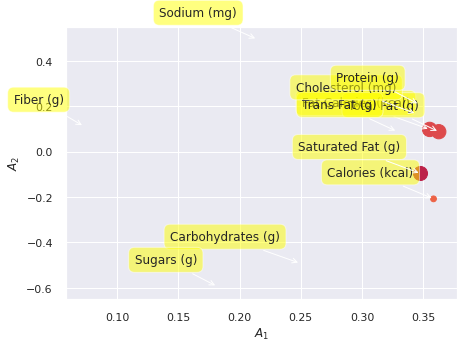

In [ ]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

Text(0, 0.5, 'Explained variance')

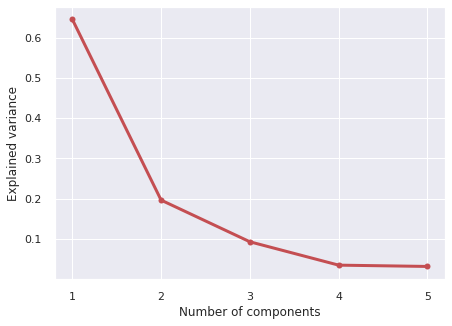

In [ ]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 

In [ ]:
Lambda

array([6.9188344 , 2.10131735, 0.99088347, 0.36831435, 0.33365131])

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

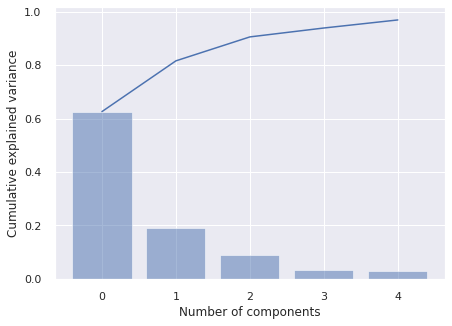

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

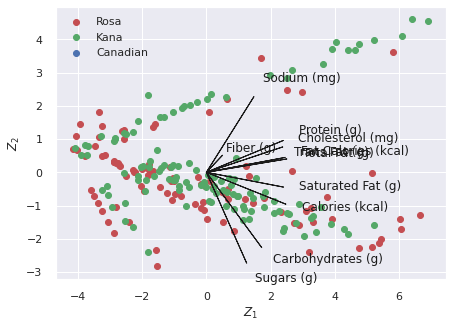

In [ ]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Rosa,0], Z[idx_Rosa,1], c='r', label='Rosa')
plt.scatter(Z[idx_Kana,0], Z[idx_Kana,1], c='g', label='Kana')
plt.scatter(Z[idx_Canadian,0], Z[idx_Canadian,1], c='b', label='Canadian')
plt.legend(loc='upper left')

##**Using PCA Library**

In [ ]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [11] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [5] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [11] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[5]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [ ]:
out['PC']

,PC1,PC2,PC3,PC4,PC5
0,0.210443,-0.488846,-0.398845,0.019850,-0.764260
1,1.791739,-1.037655,-0.413565,0.595755,-0.631911
2,3.887576,-1.558605,0.125014,0.626929,-0.925791
3,-1.123282,0.147336,-0.952417,0.360282,-0.325041
4,0.676832,-0.502932,-1.064192,-0.396850,-0.459268
...,...,...,...,...,...
220,-1.582915,-2.326588,1.775637,-1.343411,1.213919
221,-2.294539,-1.636422,0.965458,-1.008568,0.827033
222,-2.537356,-0.931849,2.856852,-0.839259,0.065970
223,-3.079581,-0.687943,0.785431,-0.555910,0.187008


**Scatter plot**

[colourmap]> Warning: Colormap [Set1] can not create [225] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [225] unique colors! Available unique colors: [9].


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fe703c63220>)

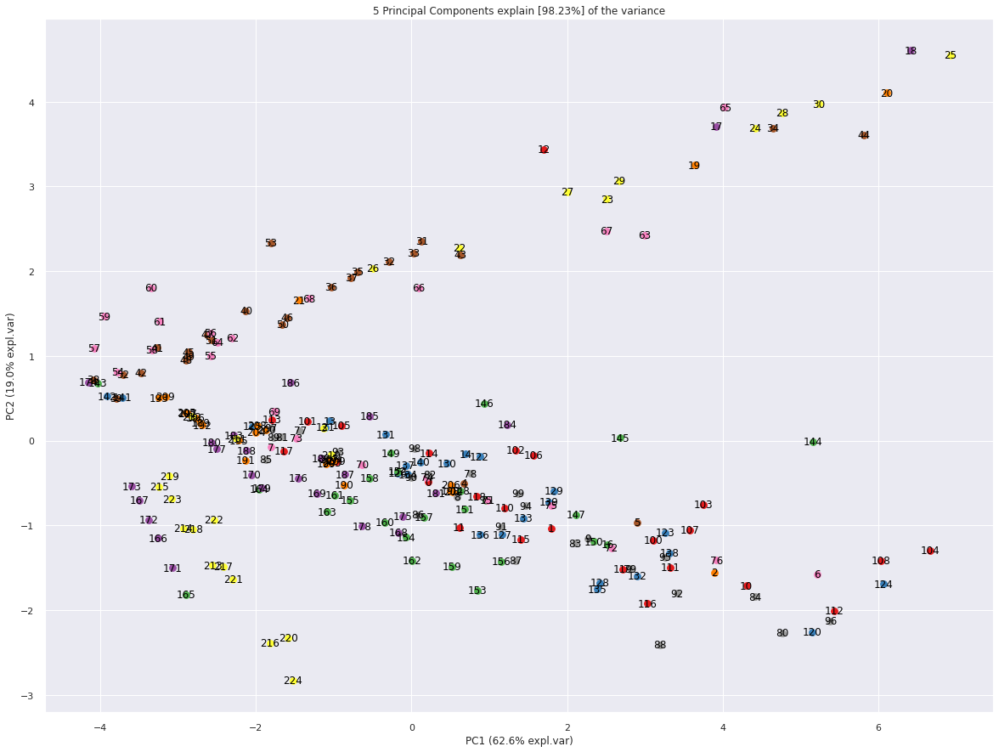

In [ ]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [ ]:
A = out['loadings'].T

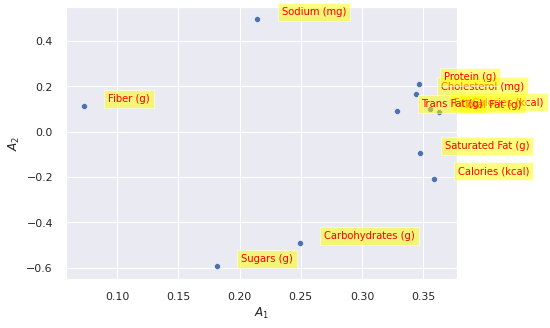

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

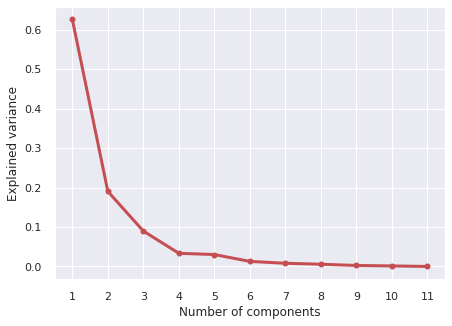

In [ ]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

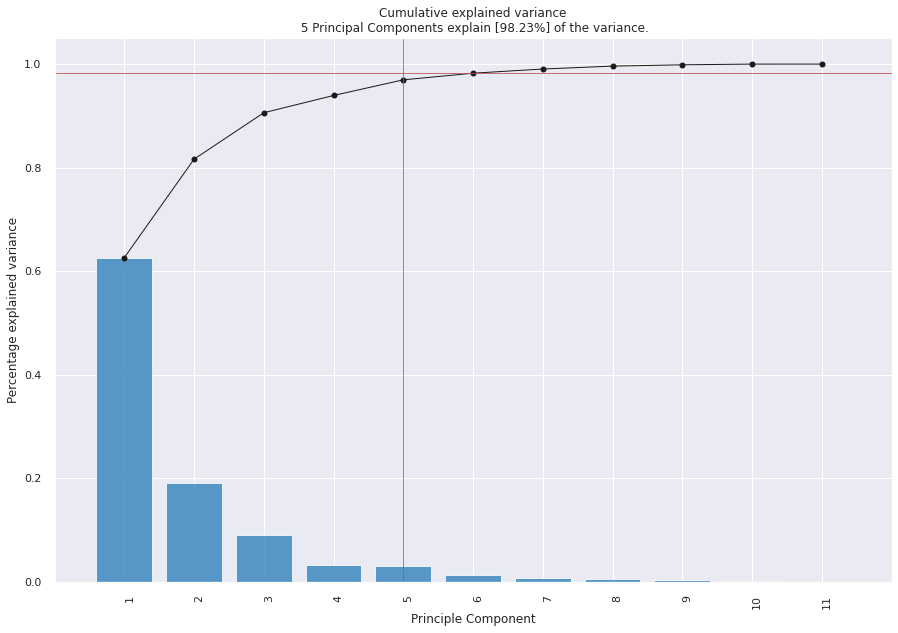

<Figure size 504x360 with 0 Axes>

In [ ]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [225] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [225] unique colors! Available unique colors: [9].


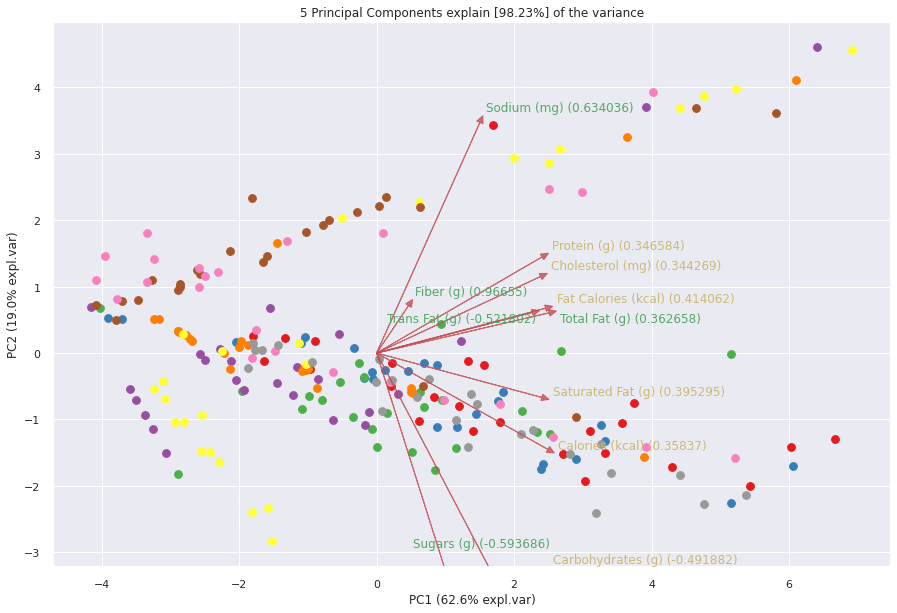

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fe6217eaf10>)

In [ ]:
model.biplot(label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [225] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [225] unique colors! Available unique colors: [9].


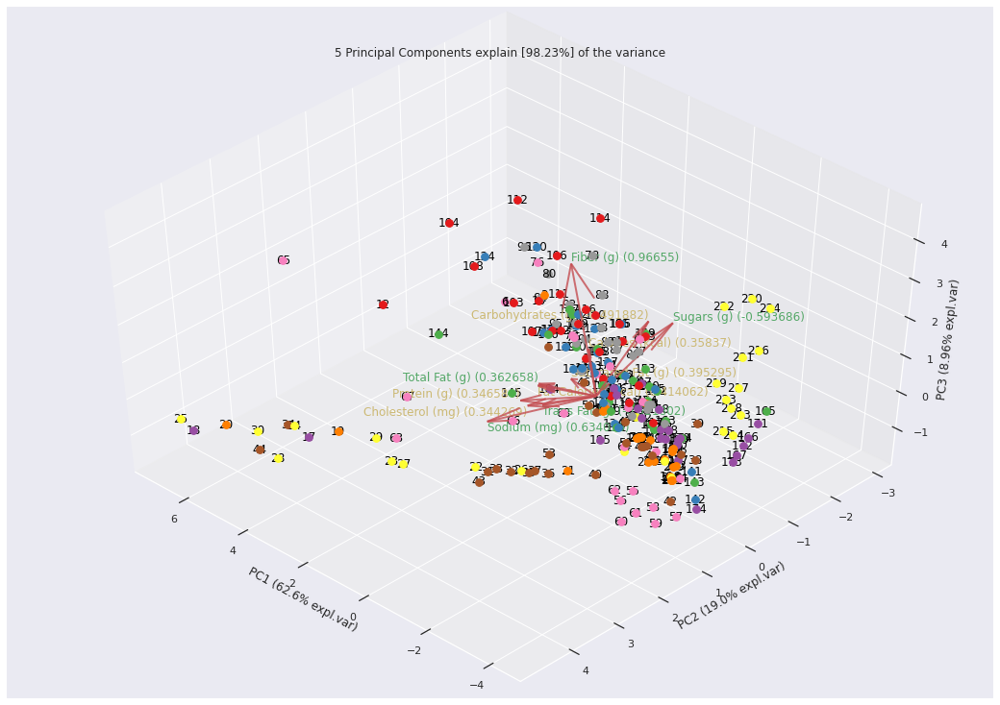

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7fe621e82760>)

In [ ]:
model.biplot3d(legend=False)

#**Classification**

**Using PyCaret**

PyCaret uses interactive plotting ability. In order to render interactive plots in Google Colab, run the below line of code in your colab notebook.

In [ ]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [ ]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/saichaitanyakumar/INSE-_6220_-PROJECT/main/diary_queen.csv')
df.head(25)

,Calories (kcal),Fat Calories (kcal),Total Fat (g),Saturated Fat (g),Trans Fat (g),Cholesterol (mg),Sodium (mg),Carbohydrates (g),Sugars (g),Protein (g),Fiber (g),class
0,600,100,27.0,21.0,1.0,45,240,79,65,12.0,1,1
1,830,170,39.0,31.0,1.0,55,310,106,86,16.0,1,1
2,1100,230,52.0,41.0,1.5,75,410,140,113,20.0,2,1
3,360,300,13.0,8.0,0.5,45,150,53,43,8.0,0,0
4,620,240,22.0,14.0,1.0,85,270,93,75,13.0,0,0
5,890,350,32.0,20.0,1.5,120,390,132,106,18.0,1,1
6,1170,470,43.0,27.0,2.0,160,520,175,139,22.0,1,1
7,390,110,16.0,8.0,0.0,35,160,54,42,8.0,0,0
8,700,200,30.0,14.0,1.0,55,290,95,74,13.0,0,0
9,960,290,42.0,19.0,1.0,75,400,129,100,17.0,1,1


In [ ]:
df["class"].unique()
print(df.count())

Calories (kcal)        225
Fat Calories (kcal)    225
Total Fat (g)          225
Saturated Fat (g)      225
Trans Fat (g)          225
Cholesterol (mg)       225
Sodium (mg)            225
Carbohydrates (g)      225
Sugars (g)             225
Protein (g)            225
Fiber (g)              225
class                  225
dtype: int64


In order to demonstrate the predict_model() function on unseen data, a sample of 21 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 21 records were not available at the time when the machine learning experiment was performed.

In [ ]:
data = df.sample(frac=0.9, random_state=786)
print(data.count())
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Calories (kcal)        202
Fat Calories (kcal)    202
Total Fat (g)          202
Saturated Fat (g)      202
Trans Fat (g)          202
Cholesterol (mg)       202
Sodium (mg)            202
Carbohydrates (g)      202
Sugars (g)             202
Protein (g)            202
Fiber (g)              202
class                  202
dtype: int64
Data for Modeling: (202, 12)
Unseen Data For Predictions: (23, 12)


In [ ]:
data_unseen

,Calories (kcal),Fat Calories (kcal),Total Fat (g),Saturated Fat (g),Trans Fat (g),Cholesterol (mg),Sodium (mg),Carbohydrates (g),Sugars (g),Protein (g),Fiber (g),class
0,890,350,32.0,20.0,1.5,120,390,132,106,18.0,1,1
1,910,580,65.0,27.0,2.5,170,1820,38,7,46.0,2,1
2,610,330,37.0,15.0,2.0,110,1190,36,7,33.0,1,1
3,820,500,55.0,24.0,2.5,155,1930,40,9,41.0,2,1
4,130,20,2.0,0.0,0.0,0,150,26,2,2.0,2,1
5,240,120,13.0,3.0,0.0,25,390,25,7,6.0,2,1
6,370,140,15.0,9.0,0.0,30,180,53,46,8.0,2,0
7,800,240,27.0,17.0,1.0,60,250,124,107,16.0,1,1
8,1120,440,49.0,21.0,1.0,65,860,145,111,29.0,2,0
9,1040,410,46.0,21.0,1.5,105,530,140,112,19.0,1,1


In [ ]:
print(data_unseen.count())

Calories (kcal)        23
Fat Calories (kcal)    23
Total Fat (g)          23
Saturated Fat (g)      23
Trans Fat (g)          23
Cholesterol (mg)       23
Sodium (mg)            23
Carbohydrates (g)      23
Sugars (g)             23
Protein (g)            23
Fiber (g)              23
class                  23
dtype: int64


In [ ]:
print(data.index)

RangeIndex(start=0, stop=202, step=1)


**Setting up the Environment in PyCaret**

The setup() function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline (we will see them in later tutorials).

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [ ]:
from pycaret.classification import *
clf = setup(data=data, target='class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(202, 12)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

Once the setup has been succesfully executed it prints the information grid which contains several important pieces of information. Most of the information is related to the pre-processing pipeline which is constructed when setup() is executed. The majority of these features are out of scope for the purposes of this tutorial however a few important things to note at this stage include:

* **session_id** : A pseduo-random number distributed as a seed in all functions for later reproducibility. If no session_id is passed, a random number is automatically generated that is distributed to all functions. In this experiment, the session_id is set as 123 for later reproducibility.

* **Target Type** : Binary or Multiclass. The Target type is automatically detected and shown. There is no difference in how the experiment is performed for Binary or Multiclass problems. All functionalities are identical.

* **Label Encoded** : When the Target variable is of type string (i.e. 'Yes' or 'No') instead of 1 or 0, it automatically encodes the label into 1 and 0 and displays the mapping (0 : No, 1 : Yes) for reference. 

* **Original Data** : Displays the original shape of the dataset. In this experiment (189, 8) means 189 samples and 8 features including the class column.

* **Missing Values** : When there are missing values in the original data this will show as True. For this experiment there are no missing values in the dataset.

* **Numeric Features** : The number of features inferred as numeric. In this dataset, 7 out of 8 features are inferred as numeric.

* **Categorical Features** : The number of features inferred as categorical. In this dataset, there are no categorical features.

* **Transformed Train Set** : Displays the shape of the transformed training set. Notice that the original shape of (189, 8) is transformed into (132, 7) for the transformed train set.

* **Transformed Test Set** : Displays the shape of the transformed test/hold-out set. There are 57 samples in test/hold-out set. This split is based on the default value of 70/30 that can be changed using the train_size parameter in setup.

Notice how a few tasks that are imperative to perform modeling are automatically handled such as missing value imputation, categorical encoding etc. Most of the parameters in setup() are optional and used for customizing the pre-processing pipeline. 

**Comparing All Models**

In [ ]:
 #show the best model and their statistics
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.7519,0.7845,0.7839,0.7835,0.7757,0.5010,0.5141,0.011
ridge,Ridge Classifier,0.7448,0.0000,0.7964,0.7702,0.7758,0.4844,0.4957,0.010
lightgbm,Light Gradient Boosting Machine,0.7443,0.7810,0.8089,0.7694,0.7773,0.4752,0.4989,0.099
rf,Random Forest Classifier,0.7224,0.7728,0.7607,0.7633,0.7484,0.4363,0.4595,0.166
gbc,Gradient Boosting Classifier,0.7162,0.7465,0.7589,0.7520,0.7457,0.4236,0.4367,0.083
lr,Logistic Regression,0.7090,0.7778,0.7714,0.7446,0.7467,0.4084,0.4235,0.443
et,Extra Trees Classifier,0.7014,0.7792,0.7732,0.7269,0.7326,0.3886,0.4154,0.142
dt,Decision Tree Classifier,0.6810,0.6789,0.7054,0.7372,0.7011,0.3562,0.3751,0.012
ada,Ada Boost Classifier,0.6600,0.7067,0.7089,0.7076,0.6929,0.3096,0.3292,0.074
knn,K Neighbors Classifier,0.5881,0.6159,0.7089,0.6021,0.6417,0.1621,0.1775,0.015


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

* Quadratic Discriminant Analysis ('qda')
* K Neighbors Classifier ('knn')
* Ada Boost Classifier ('ada')

There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.

**Create Quadratic Discriminant Analysis**

In [ ]:
qda = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.4667,0.0,0.0,0.0,0.0,0.0,0.0
1,0.5000,0.0,0.0,0.0,0.0,0.0,0.0
2,0.5000,0.0,0.0,0.0,0.0,0.0,0.0
3,0.4286,0.0,0.0,0.0,0.0,0.0,0.0
4,0.4286,0.0,0.0,0.0,0.0,0.0,0.0
5,0.4286,0.0,0.0,0.0,0.0,0.0,0.0
6,0.4286,0.0,0.0,0.0,0.0,0.0,0.0
7,0.4286,0.0,0.0,0.0,0.0,0.0,0.0
8,0.4286,0.0,0.0,0.0,0.0,0.0,0.0
9,0.4286,0.0,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
#trained model object is stored in the variable 'qda'. 
qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

**Tune a Model:** How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.

**Tune Quadratic Discriminant Analysis Model**

In [ ]:
tuned_qda = tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.6786,0.5000,0.6667,0.5714,0.2105,0.2182
1,0.7857,0.8980,0.7143,0.8333,0.7692,0.5714,0.5774
2,0.5714,0.6531,0.4286,0.6000,0.5000,0.1429,0.1491
3,0.6429,0.9167,0.3750,1.0000,0.5455,0.3396,0.4523
4,0.5714,0.5833,0.5000,0.6667,0.5714,0.1600,0.1667
5,0.7143,0.8750,0.5000,1.0000,0.6667,0.4615,0.5477
6,0.4286,0.7292,0.1250,0.5000,0.2000,-0.0370,-0.0589
7,0.7143,0.9792,0.5000,1.0000,0.6667,0.4615,0.5477
8,0.7143,0.8958,0.5000,1.0000,0.6667,0.4615,0.5477
9,0.6429,0.7708,0.5000,0.8000,0.6154,0.3137,0.3443


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
#tuned model object is stored in the variable 'tuned_qda'. 
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)

**Evaluate Quadratic Discriminant Analysis**

Update statmodels

In [ ]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


How to analyze model performance using various plots

In [ ]:
evaluate_model(tuned_qda)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K Neighbors Model**

In [ ]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6667,0.6875,0.7500,0.6667,0.7059,0.3243,0.3273
1,0.6429,0.7755,1.0000,0.5833,0.7368,0.2857,0.4082
2,0.5000,0.5816,0.7143,0.5000,0.5882,0.0000,0.0000
3,0.8571,0.8958,1.0000,0.8000,0.8889,0.6957,0.7303
4,0.5714,0.4896,0.8750,0.5833,0.7000,0.0455,0.0589
5,0.5000,0.5312,0.5000,0.5714,0.5333,0.0000,0.0000
6,0.3571,0.4167,0.2500,0.4000,0.3077,-0.2353,-0.2582
7,0.5714,0.6562,0.6250,0.6250,0.6250,0.1250,0.1250
8,0.5714,0.4688,0.6250,0.6250,0.6250,0.1250,0.1250
9,0.6429,0.6562,0.7500,0.6667,0.7059,0.2553,0.2582


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


**Tune K Neighbors Model**

In [ ]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7333,0.8125,1.0000,0.6667,0.8000,0.4444,0.5345
1,0.7857,0.9796,1.0000,0.7000,0.8235,0.5714,0.6325
2,0.7857,0.8265,1.0000,0.7000,0.8235,0.5714,0.6325
3,0.8571,0.7813,1.0000,0.8000,0.8889,0.6957,0.7303
4,0.5714,0.2500,0.8750,0.5833,0.7000,0.0455,0.0589
5,0.5000,0.4896,0.7500,0.5455,0.6316,-0.0889,-0.1005
6,0.4286,0.4896,0.2500,0.5000,0.3333,-0.0769,-0.0913
7,0.7143,0.6667,0.8750,0.7000,0.7778,0.3913,0.4108
8,0.5714,0.5104,0.8750,0.5833,0.7000,0.0455,0.0589
9,0.5000,0.5625,0.7500,0.5455,0.6316,-0.0889,-0.1005


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=38, p=2,
                     weights='uniform')
INFO:logs:tune_model() succesfully completed......................................


**Evaluate K Neighbors Model**

In [ ]:
evaluate_model(tuned_knn)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=38, p=2,
                     weights='uniform'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Ada Boost Classifier	 Model**

In [ ]:
ada = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.7321,0.5000,0.6667,0.5714,0.2105,0.2182
1,0.8571,0.9388,1.0000,0.7778,0.8750,0.7143,0.7454
2,0.5000,0.4694,0.7143,0.5000,0.5882,0.0000,0.0000
3,0.6429,0.6875,0.5000,0.8000,0.6154,0.3137,0.3443
4,0.5000,0.5833,0.7500,0.5455,0.6316,-0.0889,-0.1005
5,0.7143,0.8333,0.6250,0.8333,0.7143,0.4400,0.4583
6,0.6429,0.6458,0.6250,0.7143,0.6667,0.2857,0.2887
7,0.7857,0.8750,0.7500,0.8571,0.8000,0.5714,0.5774
8,0.7143,0.6667,1.0000,0.6667,0.8000,0.3636,0.4714
9,0.6429,0.6354,0.6250,0.7143,0.6667,0.2857,0.2887


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=123)
INFO:logs:create_model() succesfully completed......................................


**Tune Ada Boost Classifier	 Model**

In [ ]:
tuned_ada = tune_model(ada)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8000,0.7946,0.8750,0.7778,0.8235,0.5946,0.6001
1,0.7857,0.7857,1.0000,0.7000,0.8235,0.5714,0.6325
2,0.6429,0.6429,0.8571,0.6000,0.7059,0.2857,0.3162
3,0.5714,0.5625,0.6250,0.6250,0.6250,0.1250,0.1250
4,0.8571,0.8333,1.0000,0.8000,0.8889,0.6957,0.7303
5,0.7143,0.6875,0.8750,0.7000,0.7778,0.3913,0.4108
6,0.7857,0.7917,0.7500,0.8571,0.8000,0.5714,0.5774
7,0.8571,0.8542,0.8750,0.8750,0.8750,0.7083,0.7083
8,0.6429,0.6042,0.8750,0.6364,0.7368,0.2222,0.2513
9,0.7857,0.7708,0.8750,0.7778,0.8235,0.5532,0.5594


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.001,
                   n_estimators=90, random_state=123)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Ada Boost Classifier	 Model**

In [ ]:
evaluate_model(tuned_ada)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.001,
                   n_estimators=90, random_state=123), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Extra Trees Classifier Model**

In [ ]:
et = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.7500,0.5000,0.6667,0.5714,0.2105,0.2182
1,0.8571,1.0000,0.7143,1.0000,0.8333,0.7143,0.7454
2,0.5000,0.5714,0.5714,0.5000,0.5333,0.0000,0.0000
3,0.7143,0.7188,0.8750,0.7000,0.7778,0.3913,0.4108
4,0.5000,0.4792,0.6250,0.5556,0.5882,-0.0426,-0.0430
5,0.5714,0.5312,0.6250,0.6250,0.6250,0.1250,0.1250
6,0.4286,0.5625,0.3750,0.5000,0.4286,-0.1200,-0.1250
7,0.6429,0.6250,0.7500,0.6667,0.7059,0.2553,0.2582
8,0.7143,0.6667,1.0000,0.6667,0.8000,0.3636,0.4714
9,0.6429,0.6250,0.7500,0.6667,0.7059,0.2553,0.2582


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune Extra Trees Classifier Model**

In [ ]:
tuned_et = tune_model(et)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6667,0.8214,0.6250,0.7143,0.6667,0.3363,0.3393
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.6429,0.5714,0.7143,0.6250,0.6667,0.2857,0.2887
3,0.7143,0.7292,0.8750,0.7000,0.7778,0.3913,0.4108
4,0.4286,0.3958,0.6250,0.5000,0.5556,-0.2174,-0.2282
5,0.5000,0.5417,0.6250,0.5556,0.5882,-0.0426,-0.0430
6,0.4286,0.4792,0.2500,0.5000,0.3333,-0.0769,-0.0913
7,0.7857,0.7708,0.8750,0.7778,0.8235,0.5532,0.5594
8,0.7143,0.5833,0.8750,0.7000,0.7778,0.3913,0.4108
9,0.7143,0.7500,0.7500,0.7500,0.7500,0.4167,0.4167


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Extra Trees Classifier Model**

In [ ]:
evaluate_model(tuned_et)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Tune the Best Model**

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7333,0.7679,0.7500,0.7500,0.7500,0.4643,0.4643
1,0.8571,0.9184,1.0000,0.7778,0.8750,0.7143,0.7454
2,0.6429,0.5918,0.7143,0.6250,0.6667,0.2857,0.2887
3,0.8571,0.7083,1.0000,0.8000,0.8889,0.6957,0.7303
4,0.5000,0.4792,0.7500,0.5455,0.6316,-0.0889,-0.1005
5,0.5000,0.3542,0.6250,0.5556,0.5882,-0.0426,-0.0430
6,0.4286,0.4583,0.2500,0.5000,0.3333,-0.0769,-0.0913
7,0.7857,0.8125,0.8750,0.7778,0.8235,0.5532,0.5594
8,0.6429,0.6667,0.7500,0.6667,0.7059,0.2553,0.2582
9,0.7143,0.7500,0.7500,0.7500,0.7500,0.4167,0.4167


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=0.7,
                           solver='lsqr', store_covariance=False, tol=0.0001)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=0.7,
                           solver='lsqr', store_covariance=False, tol=0.0001)

**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [ ]:
evaluate_model(tuned_best_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=0.7,
                           solver='lsqr', store_covariance=False, tol=0.0001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Classification + PCA**

In [ ]:
clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(202, 12)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('dummy', Dummify(target='class')),
                ('fix_perfect', Remove_100(target='class')),
                ('clean_names', Clean_Colum_Names()),
       

In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.6452,0.6695,0.7179,0.6652,0.6800,0.2723,0.2910,0.011
ada,Ada Boost Classifier,0.6376,0.6474,0.7161,0.6578,0.6778,0.2572,0.2690,0.073
knn,K Neighbors Classifier,0.6224,0.6457,0.7714,0.6273,0.6836,0.2160,0.2236,0.019
et,Extra Trees Classifier,0.6171,0.6530,0.6786,0.6547,0.6569,0.2153,0.2319,0.163
lightgbm,Light Gradient Boosting Machine,0.6100,0.6686,0.6821,0.6328,0.6450,0.2077,0.2216,0.025
lr,Logistic Regression,0.6043,0.6263,0.7732,0.5946,0.6638,0.1871,0.2162,0.015
rf,Random Forest Classifier,0.6024,0.6581,0.6929,0.6262,0.6485,0.1823,0.1884,0.181
ridge,Ridge Classifier,0.5971,0.0000,0.7857,0.5976,0.6698,0.1663,0.1991,0.011
nb,Naive Bayes,0.5967,0.6653,0.8232,0.5952,0.6861,0.1514,0.1967,0.011
lda,Linear Discriminant Analysis,0.5900,0.6305,0.7857,0.5912,0.6657,0.1494,0.1832,0.019


INFO:logs:create_model_container: 42
INFO:logs:master_model_container: 42
INFO:logs:display_container: 4
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

**Tune the Best Model**

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6667,0.8393,0.6250,0.7143,0.6667,0.3363,0.3393
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.7143,0.6327,0.7143,0.7143,0.7143,0.4286,0.4286
3,0.6429,0.7083,0.6250,0.7143,0.6667,0.2857,0.2887
4,0.3571,0.4583,0.3750,0.4286,0.4000,-0.2857,-0.2887
5,0.4286,0.3750,0.5000,0.5000,0.5000,-0.1667,-0.1667
6,0.3571,0.4792,0.1250,0.3333,0.1818,-0.1887,-0.2513
7,0.7143,0.7917,0.7500,0.7500,0.7500,0.4167,0.4167
8,0.6429,0.6042,0.6250,0.7143,0.6667,0.2857,0.2887
9,0.7857,0.8125,0.7500,0.8571,0.8000,0.5714,0.5774


INFO:logs:create_model_container: 43
INFO:logs:master_model_container: 43
INFO:logs:display_container: 5
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.92,
                              store_covariance=False, tol=0.0001)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.92,
                              store_covariance=False, tol=0.0001)

**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [ ]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=QuadraticDiscriminantAnalysis(priors=None, reg_param=0.92,
                              store_covariance=False, tol=0.0001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Note:** The AUC metric is not available for Multiclass classification however the column will still be shown with zero values to maintain consistency between the Binary Classification and Multiclass Classification display grids.

#**Explainable AI with Shapley values**

Shapley values are a widely used approach from cooperative game theory that come with desirable properties.

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import shap

In [ ]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.7500,0.5000,0.6667,0.5714,0.2105,0.2182
1,0.8571,1.0000,0.7143,1.0000,0.8333,0.7143,0.7454
2,0.5000,0.5714,0.5714,0.5000,0.5333,0.0000,0.0000
3,0.7143,0.7188,0.8750,0.7000,0.7778,0.3913,0.4108
4,0.5000,0.4792,0.6250,0.5556,0.5882,-0.0426,-0.0430
5,0.5714,0.5312,0.6250,0.6250,0.6250,0.1250,0.1250
6,0.4286,0.5625,0.3750,0.5000,0.4286,-0.1200,-0.1250
7,0.6429,0.6250,0.7500,0.6667,0.7059,0.2553,0.2582
8,0.7143,0.6667,1.0000,0.6667,0.8000,0.3636,0.4714
9,0.6429,0.6250,0.7500,0.6667,0.7059,0.2553,0.2582


INFO:logs:create_model_container: 44
INFO:logs:master_model_container: 44
INFO:logs:display_container: 6
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6667,0.8214,0.6250,0.7143,0.6667,0.3363,0.3393
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.6429,0.5714,0.7143,0.6250,0.6667,0.2857,0.2887
3,0.7143,0.7292,0.8750,0.7000,0.7778,0.3913,0.4108
4,0.4286,0.3958,0.6250,0.5000,0.5556,-0.2174,-0.2282
5,0.5000,0.5417,0.6250,0.5556,0.5882,-0.0426,-0.0430
6,0.4286,0.4792,0.2500,0.5000,0.3333,-0.0769,-0.0913
7,0.7857,0.7708,0.8750,0.7778,0.8235,0.5532,0.5594
8,0.7143,0.5833,0.8750,0.7000,0.7778,0.3913,0.4108
9,0.7143,0.7500,0.7500,0.7500,0.7500,0.4167,0.4167


INFO:logs:create_model_container: 45
INFO:logs:master_model_container: 45
INFO:logs:display_container: 7
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


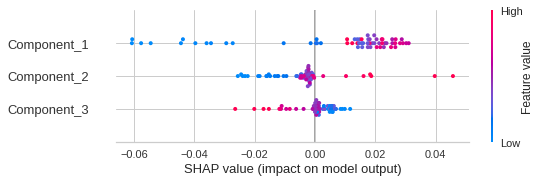

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_et_pca, plot='summary')

In [ ]:
#explainer = shap.TreeExplainer(tuned_et_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

**Visualize a single prediction**

In [ ]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


From the above the plot, we can seethe "base value," which is defined as the mean predicted target; and f(x), which is the prediction for a selected observation (i.e. observation number 32). The red-colored features increased the predicted value, while the blue-colored features decreased it. The size of each feature (i.e. Principal Component) indicates the impact it has on the model.

**Visualize many predictions**

In [ ]:
interpret_model(tuned_et_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................
